In [1]:
import numpy as np
import pandas as pd

# import tensorflow as tf
import matplotlib.pyplot as plt
from datetime import datetime

import json
import sys
import glob
import os.path
import re
import cv2
import tarfile, gzip
from enum import Enum

import tensorflow.compat.v1 as tf
from tensorflow.io.gfile import GFile
tf.disable_v2_behavior()

from visualization_v2 import load_session, visualize_gradcam_discrete_ppo, visualize_cam_discrete_ppo, rgb2gray

%matplotlib inline

2023-10-31 17:46:34.483091: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-10-31 17:46:34.483149: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-10-31 17:46:34.507562: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-10-31 17:46:36.692751: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


Instructions for updating:
non-resource variables are not supported in the long term


In [2]:
GRAD_CAM_CONSIDER_INDEX = True #takes true/false
HEATMAP_TYPE = 'gradcam'
MODELS_BASE_PATH = '../models'
IMAGES_BASE_PATH = '../images'
available_models = glob.glob(f"{MODELS_BASE_PATH}/*.tar.gz")
available_models = list(map(lambda x: os.path.basename(x).split('.tar.gz')[0], available_models))
available_track_samples = glob.glob(f"{IMAGES_BASE_PATH}/*")
available_track_samples = list(map(lambda x: os.path.basename(x), available_track_samples))
available_models, available_track_samples

(['JPMC-Rogue-HYD-0',
  'model',
  'pirates-centerline-2018-2-console-model',
  'rogue-2018-C-01-clone-model',
  'rogue-2018-CWF-disc-2-clone-model',
  'rogue-2018W-C12-1-3-DC-MM-FINAL-NYC-COPY-2-model',
  'rogue-2018W-C1300-1-DC-model',
  'rogue-2018W-NY-ARP-9G-DPMODS-1-DRFC-model',
  'rogue-2018W-NY-P-9G-DS-1-DRFC-model',
  'rogue-2018W-SPDC15D2-0'],
 ['dbro-pro', 'reInvent2019_wide'])

In [3]:
#Configuration
MODELS = ['pirates-centerline-2018-2-console-model', 'model'] #Specify one or two physical car models
TRACKS = ['reInvent2019_wide'] #Specify all track images to load
DIRECTION = ['cw']

In [4]:
for model in MODELS:
    model_path  = MODELS_BASE_PATH + "/" + model
    if not os.path.exists(model_path):
        os.makedirs(model_path)
        with tarfile.open(fileobj=gzip.open(model_path + '.tar.gz', 'rb'), mode='r') as tar:
            tar.extractall(model_path)
        print(f"Extracted model to {model_path}")
    else:
        print(f"Directory '{model_path}' already exists, skipping the unzip")

Directory '../models/pirates-centerline-2018-2-console-model' already exists, skipping the unzip
Directory '../models/model' already exists, skipping the unzip


In [5]:
models_metadata = {}
for model in MODELS:
    models_metadata[model] = {}
    model_path  = MODELS_BASE_PATH + "/" + model
    with open("{}/model_metadata.json".format(model_path),"r") as jsonin:
        model_metadata=json.load(jsonin)
    my_sensor = [sensor for sensor in model_metadata['sensor'] if sensor != "LIDAR"][0]  
    action_names = []
    degree_sign= u'\N{DEGREE SIGN}'
    for action in model_metadata['action_space']:
        action_names.append(str(action['steering_angle'])+ degree_sign + " "+"%.1f"%action["speed"])
    models_metadata[model]['base_path'] = model_path
    models_metadata[model]['agent_path'] = model_path + "/agent/model.pb"
    models_metadata[model]['sensor'] = my_sensor
    models_metadata[model]['action_names'] = action_names
    models_metadata[model]['metadata'] = model_metadata
models_metadata  

{'pirates-centerline-2018-2-console-model': {'base_path': '../models/pirates-centerline-2018-2-console-model',
  'agent_path': '../models/pirates-centerline-2018-2-console-model/agent/model.pb',
  'sensor': 'FRONT_FACING_CAMERA',
  'action_names': ['30° 0.9',
   '15° 1.5',
   '10° 2.3',
   '5° 2.9',
   '0° 3.5',
   '-5° 2.9',
   '-10° 2.3',
   '-15° 1.5',
   '-30° 0.9'],
  'metadata': {'action_space': [{'steering_angle': 30,
     'speed': 0.9,
     'index': 0},
    {'steering_angle': 15, 'speed': 1.5, 'index': 1},
    {'steering_angle': 10, 'speed': 2.3, 'index': 2},
    {'steering_angle': 5, 'speed': 2.9, 'index': 3},
    {'steering_angle': 0, 'speed': 3.5, 'index': 4},
    {'steering_angle': -5, 'speed': 2.9, 'index': 5},
    {'steering_angle': -10, 'speed': 2.3, 'index': 6},
    {'steering_angle': -15, 'speed': 1.5, 'index': 7},
    {'steering_angle': -30, 'speed': 0.9, 'index': 8}],
   'sensor': ['FRONT_FACING_CAMERA'],
   'neural_network': 'DEEP_CONVOLUTIONAL_NETWORK_SHALLOW',
   

In [6]:
track_images = {}
for i, track in enumerate(TRACKS):
    direction_i = 'cw' if len(DIRECTION) < i else DIRECTION[i]
    images_path  = IMAGES_BASE_PATH + "/" + track + "/" + direction_i
    picture_files = sorted(glob.glob(images_path + "/*"))
    track_images[track] = picture_files
len_of_plots = sum(len(array) for array in track_images.values())
track_images

{'reInvent2019_wide': ['../images/reInvent2019_wide/cw/0.png',
  '../images/reInvent2019_wide/cw/1.png',
  '../images/reInvent2019_wide/cw/10.jpeg',
  '../images/reInvent2019_wide/cw/11.jpeg',
  '../images/reInvent2019_wide/cw/12.jpeg',
  '../images/reInvent2019_wide/cw/13.jpeg',
  '../images/reInvent2019_wide/cw/14.jpeg',
  '../images/reInvent2019_wide/cw/15.jpeg',
  '../images/reInvent2019_wide/cw/16.jpeg',
  '../images/reInvent2019_wide/cw/17.jpeg',
  '../images/reInvent2019_wide/cw/2.jpeg',
  '../images/reInvent2019_wide/cw/3.jpeg',
  '../images/reInvent2019_wide/cw/4.jpeg',
  '../images/reInvent2019_wide/cw/5.jpeg',
  '../images/reInvent2019_wide/cw/6.jpeg',
  '../images/reInvent2019_wide/cw/7.jpeg',
  '../images/reInvent2019_wide/cw/8.jpeg',
  '../images/reInvent2019_wide/cw/9.jpeg']}

In [8]:
for model_name, metadata in models_metadata.items():
    model, obs, model_out = load_session(metadata['agent_path'], metadata['sensor'])
    for track, picture_files in track_images.items():
        arr = {}
        for f in picture_files:
            img = cv2.imread(f)
            img = cv2.resize(img, dsize=(160, 120), interpolation=cv2.INTER_CUBIC)
            img_arr = np.array(img)
            img_arr = rgb2gray(img_arr)
            img_arr = np.expand_dims(img_arr, axis=2)
            y_output = model.run(model_out, feed_dict={obs:[img_arr]})[0]
            arr[f] = y_output
        models_metadata[model_name][track] = arr
    model.close()
    tf.reset_default_graph()

2023-10-31 17:48:30.419376: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:48:31.190436: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:48:31.190515: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:48:39.334925: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:48:39.335006: I tensorflow/compile

load graph: ../models/pirates-centerline-2018-2-console-model/agent/model.pb


2023-10-31 17:48:39.930616: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:382] MLIR V1 optimization pass is not enabled
2023-10-31 17:48:56.333224: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:442] Loaded cuDNN version 8700
2023-10-31 17:49:11.965973: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-10-31 17:49:14.737139: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2023-10-31 17:49:15.426424: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:49:15.426513: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA 

load graph: ../models/model/agent/model.pb


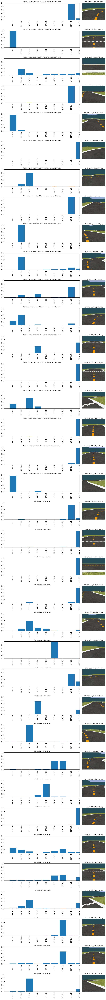

In [9]:
fig = plt.figure(figsize=(12, 5*len_of_plots))
shape = (len_of_plots * len(models_metadata), 5)
iter = 0

for model_name, model_values in models_metadata.items():
    action_names = model_values['action_names']
    action_count = list(range(1,len(action_names)+1))
    for track, images in track_images.items():
        model_inference = model_values[track]
        for f in images:
            img = cv2.imread(f)
            img = cv2.resize(img, dsize=(160, 120))

            ax0 = plt.subplot2grid(shape, (iter, 0), colspan=3)
            ax1 = plt.subplot2grid(shape, (iter, 3))
            
            ax0.bar(action_count, model_inference[f])
            ax0.set_title("Model: "+model_name + " action probs",  fontsize=8)
            ax0.set_xticks(action_count)
            ax0.set_xticklabels(action_names, rotation='vertical')
            ax0.set_ylim((0, 1))
            ax0.set_xlim((0, len(action_count)))

            ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            ax1.set_title(('/').join(f.split('/')[2:]),  fontsize=8)
            ax1.axis('off')
            
            iter += 1
    
plt.tight_layout()
plt.show()

In [12]:
HEATMAP_TYPE = 'cam'
HEATMAP_TYPE

'cam'

In [13]:
models_heatmaps = {}
for model_name, metadata in models_metadata.items():
    model, obs, model_out = load_session(metadata['agent_path'], metadata['sensor'])
    models_heatmaps[model_name] = {}
    action_names = metadata['action_names']
    for track, picture_files in track_images.items():
        model_inference = metadata[track]
        arr = {}
        for f in picture_files:
            img = cv2.imread(f)
            img = cv2.resize(img, dsize=(160, 120), interpolation=cv2.INTER_CUBIC)
            if HEATMAP_TYPE == 'gradcam':
                category_index = np.argmax(model_inference[f]) if GRAD_CAM_CONSIDER_INDEX else 0
                heatmap = visualize_gradcam_discrete_ppo(model, obs, img, category_index=category_index, num_of_actions=len(action_names))
            else:
                heatmap = visualize_cam_discrete_ppo(model, obs, img)
            arr[f] = heatmap
        models_heatmaps[model_name][track] = arr

    model.close()
    tf.reset_default_graph()

2023-10-31 17:49:24.716927: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:49:24.717018: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:49:24.717045: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:49:24.717439: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:49:24.717466: I tensorflow/core/co

load graph: ../models/pirates-centerline-2018-2-console-model/agent/model.pb


2023-10-31 17:49:25.674088: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:49:25.674157: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:49:25.674180: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:49:25.675005: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:880] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2023-10-31 17:49:25.675032: I tensorflow/core/co

load graph: ../models/model/agent/model.pb


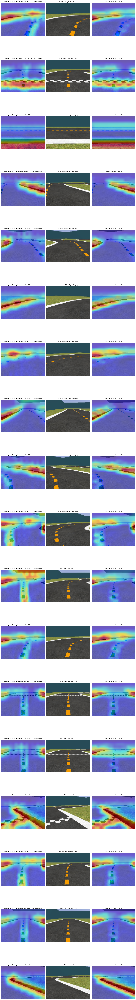

In [14]:
#Comparison of two models [0,1] 
if len(MODELS) >= 2:
    fig = plt.figure(figsize=(12, 5*len_of_plots))
    shape = (len_of_plots, 9)
    iter = 0
    model_idx = 0
    
    action_names_0 = models_metadata[MODELS[0]]['action_names']
    action_count_0 = list(range(1,len(action_names_0)+1))
    
    action_names_1 = models_metadata[MODELS[1]]['action_names']
    action_count_1 = list(range(1,len(action_names_1)+1))
    
    for track, images in track_images.items():
        for f in images:
            img = cv2.imread(f)
            img = cv2.resize(img, dsize=(160, 120))
    
            ax0 = plt.subplot2grid(shape, (iter, 0), colspan=3)
            ax1 = plt.subplot2grid(shape, (iter, 3), colspan=3)
            ax2 = plt.subplot2grid(shape, (iter, 6), colspan=3)
    
            ax0.imshow(models_heatmaps[MODELS[0]][track][f])
            ax0.set_title("heatmap for Model: " + MODELS[0],  fontsize=8)
            ax0.axis('off')
    
            ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            ax1.set_title(('/').join(f.split('/')[2:]),  fontsize=8)
            ax1.axis('off')
    
            ax2.imshow(models_heatmaps[MODELS[1]][track][f])
            ax2.set_title("heatmap for Model: " + MODELS[1],  fontsize=8)
            ax2.axis('off')
            
            iter += 1
        
    plt.tight_layout()
    plt.show()

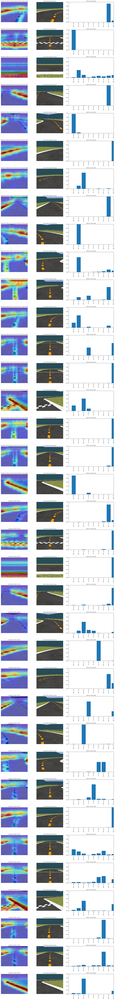

In [15]:
#Heatmap and action comparision
fig = plt.figure(figsize=(15, 7*len_of_plots))
shape = (len_of_plots * len(models_metadata), 10)
iter = 0

for model_name, model_values in models_metadata.items():
    action_names = model_values['action_names']
    action_count = list(range(1,len(action_names)+1))
    for track, images in track_images.items():
        model_inference = model_values[track]
        for f in images:
            img = cv2.imread(f)
            img = cv2.resize(img, dsize=(160, 120))

            ax0 = plt.subplot2grid(shape, (iter, 0), colspan=3)
            ax1 = plt.subplot2grid(shape, (iter, 3), colspan=3)
            ax2 = plt.subplot2grid(shape, (iter, 6), colspan=4)

            ax0.imshow(models_heatmaps[model_name][track][f])
            ax0.set_title("heatmap for Model: " + model_name,  fontsize=8)
            ax0.axis('off')

            ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            ax1.set_title(('/').join(f.split('/')[2:]),  fontsize=8)
            ax1.axis('off')

            ax2.bar(action_count, model_inference[f])
            ax2.set_title("Model: "+str(model_idx) + " action probs",  fontsize=8)
            ax2.set_xticks(action_count)
            ax2.set_xticklabels(action_names, rotation='vertical')
            ax2.set_ylim((0, 1))
            ax2.set_xlim((0, len(action_count)))
            
            iter += 1
    
plt.tight_layout()
plt.show()